In [1]:
import numpy as np
import numpy.polynomial.polynomial as poly

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from urllib.request import urlopen
import json

import itertools

from time import time
from datetime import datetime, timedelta
from pytz import timezone

import altair as alt
# from vega_datasets import data

# import `county_json`, `pop_df`, and `df`

In [2]:
with open('data/county_json.json') as f:
    county_json = json.load(f)

In [3]:
def optimize(df):
    '''
    Optimizes the data types in a pandas dataframe.
    '''
    dft = df.copy()
    # converts to datetime if possible
    dft = dft.apply(lambda col: pd.to_datetime(col, errors='ignore') if col.dtypes=='object' else col)
    # if there are less than half as many unique values as there are rows, convert to category
    for col in dft.select_dtypes(include='object'):
        if len(dft[col].unique()) / len(df[col]) < 0.5:
            dft[col] = dft[col].astype('category')
    # downcasts numeric columns if possible
    dft = dft.apply(lambda col: pd.to_numeric(col, downcast='integer') if col.dtypes=='int64' else col)
    dft = dft.apply(lambda col: pd.to_numeric(col, downcast='float') if col.dtypes=='float64' else col)
    return dft

In [4]:
df = optimize(pd.read_csv('data/df.csv'))
df.head()

,date,fips,cases,deaths,state,county,cases_per_100k,deaths_per_100k,new_cases,new_deaths,...,delta_new_cases_per_100k,delta_new_deaths_per_100k,delta_new_cases_7sg,delta_new_deaths_7sg,delta_new_cases_per_100k_7sg,delta_new_deaths_per_100k_7sg,delta_new_cases_15sg,delta_new_deaths_15sg,delta_new_cases_per_100k_15sg,delta_new_deaths_per_100k_15sg
0,2020-01-21,53061,1,0,Washington,Snohomish,0.121642,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0.0,0.000000,0.0
1,2020-01-22,53061,1,0,Washington,Snohomish,0.121642,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0.0,0.000000,0.0
2,2020-01-23,53061,1,0,Washington,Snohomish,0.121642,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0.0,0.000000,0.0
3,2020-01-24,17031,1,0,Illinois,Cook,0.019417,0.0,0.0,0.0,...,0.0,0.0,-0.178571,0.0,-0.003467,0.0,0.025,0.0,0.000485,0.0
4,2020-01-24,53061,1,0,Washington,Snohomish,0.121642,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0.0,0.000000,0.0


In [5]:
df.columns

Index(['date', 'fips', 'cases', 'deaths', 'state', 'county', 'cases_per_100k',
       'deaths_per_100k', 'new_cases', 'new_deaths', 'new_cases_per_100k',
       'new_deaths_per_100k', 'new_cases_7sg', 'new_deaths_7sg',
       'new_cases_per_100k_7sg', 'new_deaths_per_100k_7sg', 'new_cases_15sg',
       'new_deaths_15sg', 'new_cases_per_100k_15sg',
       'new_deaths_per_100k_15sg', 'delta_new_cases', 'delta_new_deaths',
       'delta_new_cases_per_100k', 'delta_new_deaths_per_100k',
       'delta_new_cases_7sg', 'delta_new_deaths_7sg',
       'delta_new_cases_per_100k_7sg', 'delta_new_deaths_per_100k_7sg',
       'delta_new_cases_15sg', 'delta_new_deaths_15sg',
       'delta_new_cases_per_100k_15sg', 'delta_new_deaths_per_100k_15sg'],
      dtype='object')

In [6]:
pop_df = optimize(pd.read_csv('data/pop_df.csv'))
df = df.merge(pop_df, on='fips', suffixes=('_x',''))
df = df.drop(['county_x', 'state_x'], axis=1)
df.columns

Index(['date', 'fips', 'cases', 'deaths', 'cases_per_100k', 'deaths_per_100k',
       'new_cases', 'new_deaths', 'new_cases_per_100k', 'new_deaths_per_100k',
       'new_cases_7sg', 'new_deaths_7sg', 'new_cases_per_100k_7sg',
       'new_deaths_per_100k_7sg', 'new_cases_15sg', 'new_deaths_15sg',
       'new_cases_per_100k_15sg', 'new_deaths_per_100k_15sg',
       'delta_new_cases', 'delta_new_deaths', 'delta_new_cases_per_100k',
       'delta_new_deaths_per_100k', 'delta_new_cases_7sg',
       'delta_new_deaths_7sg', 'delta_new_cases_per_100k_7sg',
       'delta_new_deaths_per_100k_7sg', 'delta_new_cases_15sg',
       'delta_new_deaths_15sg', 'delta_new_cases_per_100k_15sg',
       'delta_new_deaths_per_100k_15sg', 'state', 'county', 'tot_pop',
       'per_white', 'per_black', 'per_asian', 'per_hispanic', 'area', 'lon',
       'lat', 'pop_per_area', 'per_gop', 'per_dem', 'total_votes', 'per_votes',
       'per_gop_adj', 'med_income'],
      dtype='object')

In [7]:
df['days'] = ((df['date'] - df['date'].min()) / np.timedelta64(1, 'D')).astype('int')

In [8]:
df['days'].max()

180

In [9]:
la = timezone('US/Pacific')
last = df['date'].max()
df_slice = df[df['date'] == last]
df_slice.head()

,date,fips,cases,deaths,cases_per_100k,deaths_per_100k,new_cases,new_deaths,new_cases_per_100k,new_deaths_per_100k,...,lon,lat,pop_per_area,per_gop,per_dem,total_votes,per_votes,per_gop_adj,med_income,days
180,2020-07-19,53061,4849,184,589.843140,22.382168,0.0,0.0,0.000000,0.000000,...,-121.692780,48.046917,393.855042,0.376202,0.542634,309496.0,0.376478,0.409433,82751.0,180
358,2020-07-19,17031,98670,4776,1915.835693,92.733665,378.0,2.0,7.339474,0.038833,...,-87.817429,41.839622,5448.102539,0.214193,0.743758,2055215.0,0.399053,0.223595,62088.0,180
535,2020-07-19,06059,29603,494,932.174805,15.555665,592.0,0.0,18.641605,0.000000,...,-117.757965,33.698452,4016.975098,0.432801,0.509602,1092116.0,0.343899,0.459253,85398.0,180
711,2020-07-19,04013,95471,1473,2128.476807,32.839779,1601.0,29.0,35.693474,0.646540,...,-112.491508,33.348869,487.537445,0.491262,0.456797,1201934.0,0.267965,0.518177,61606.0,180
887,2020-07-19,06037,155887,4095,1552.797485,40.790482,2846.0,11.0,28.349134,0.109572,...,-118.216835,34.357796,2473.975830,0.233887,0.714072,2652072.0,0.264174,0.246727,64251.0,180


In [10]:
# https://stackoverflow.com/a/55950538
county_json_data = alt.InlineData(county_json, format=alt.DataFormat(property='features',type='json'))

In [11]:
color_col = 'delta_new_cases_per_100k_15sg'
cmax = np.percentile(df[color_col], 99.9)
cmax = cmax + (-cmax) % 10
cmin = np.percentile(df[color_col], 0.1)
cmin = cmin + (-cmin) % 10

print(cmax)
print(cmin)

20.0
-10.0


In [93]:
states = alt.topo_feature('https://vega.github.io/vega-datasets/data/us-10m.json', 'states')
ccol = 'new_cases_per_100k_15sg'
cscheme = 'redyellowblue'
csort = 'descending'
ctitle = 'new cases per 100k'
tcol = 'cases_per_100k'
ttitle = 'cases per 100k'
# counties = alt.topo_feature('https://vega.github.io/vega-datasets/data/us-10m.json', 'counties')

cmax = np.percentile(df[ccol], 99.5)
cmax = cmax + (-cmax) % 10
cmin = np.percentile(df[ccol], 0.5)
cmin = cmin + (-cmin) % 10

background = alt.Chart(states).mark_geoshape(
    fill='#E6E6E6',
    stroke='white',
    strokeWidth=1.5
)

alt.data_transformers.enable('data_server')

counts = alt.Chart(
    county_json_data
#     counties
).mark_geoshape(
    stroke='black',
    strokeWidth=0.05
).encode(
    color=alt.Color(
        ccol + ':Q',
        scale=alt.Scale(
            scheme=cscheme,
#             domainMid=0,
            domain=[cmin,cmax]
        ),
        sort=csort,
        title=ctitle
    ), 
    tooltip=[
        'state:N', 'county:N', 
        alt.Tooltip(
            ccol + ':Q',
            format='.1f',
            title=ctitle,
        ), 
        alt.Tooltip(
            tcol + ':Q',
            format='.1f',
            title=ttitle
        )]
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(df_slice, key='fips', fields=['state', 'county', ccol, tcol])
).properties(
    width=720,
    height=480
).project('albersUsa')

background + counts

alt.LayerChart(...)

In [13]:
counties = alt.topo_feature('https://vega.github.io/vega-datasets/data/us-10m.json', 'states')
background = alt.Chart(counties).mark_geoshape(
    fill='#E6E6E6',
    stroke='white',
    strokeWidth=1
).properties(
    width=720,
    height=480
).project('albersUsa')

data = alt.Data

step = 7
slider = alt.binding_range(min=df['days'].max() % step, max=df['days'].max(), step=step)
select_date = alt.selection_single(name='days', fields=['days'], bind=slider, init={'days': df['days'].max()})

alt.data_transformers.enable('data_server')

color_col = 'delta_new_cases_per_100k_7sg'
cmax = np.percentile(df[color_col], 99.9)
cmax = cmax + (-cmax) % 10
cmin = np.percentile(df[color_col], 0.1)
cmin = cmin + (-cmin) % 10

size_col = 'new_cases_7sg'
zmax = np.max(df[size_col])
zmax = zmax + (-zmax) % 10

points = alt.Chart(df).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title='New Cases per County (7d avg)'
).encode(
    latitude='lat:Q',
    longitude='lon:Q',
    size=alt.Size(
        size_col + ':Q',
        scale=alt.Scale(
            base=20,
            domain=[0,zmax],
            range=[0,10000]
        ),
        legend=alt.Legend(
            values=[10, 100, 1000, 2000]
        ),
        title='new cases (7d avg)'
    ),
    color=alt.Color(
        color_col + ':Q',
        scale=alt.Scale(
            scheme='redyellowblue',
            domainMid=0,
#             domain=[cmin,cmax]
            domain=[-20, 40],
        ),
        sort='descending',
        title='change in new cases per 100k'
    ),
    tooltip=[
        'state:N', 'county:N', 
        alt.Tooltip(
            'new_cases_7sg:Q',
            format='.1f',
            title='new cases (7d avg)',
        ), 
        alt.Tooltip(
            'delta_new_cases_per_100k_7sg:Q',
            format='.1f',
            title='change in new cases per 100k'
        )]
).add_selection(
    select_date
).transform_filter(
    select_date
)

# background + points

In [14]:
df_slice['gop'] = (df_slice['per_gop'] > df_slice['per_dem']) * 1

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [15]:
df_slice = df_slice.dropna()

# correlation heatmap

In [16]:
def cov(x, y, w):
    return np.sum(w * (x - np.average(x, weights=w)) * (y - np.average(x, weights=w))) / np.sum(w)

def corr(x, y, w):
    return cov(x, y, w) / np.sqrt(cov(x, x, w) * cov(y, y, w))

In [17]:
df_slice.columns

Index(['date', 'fips', 'cases', 'deaths', 'cases_per_100k', 'deaths_per_100k',
       'new_cases', 'new_deaths', 'new_cases_per_100k', 'new_deaths_per_100k',
       'new_cases_7sg', 'new_deaths_7sg', 'new_cases_per_100k_7sg',
       'new_deaths_per_100k_7sg', 'new_cases_15sg', 'new_deaths_15sg',
       'new_cases_per_100k_15sg', 'new_deaths_per_100k_15sg',
       'delta_new_cases', 'delta_new_deaths', 'delta_new_cases_per_100k',
       'delta_new_deaths_per_100k', 'delta_new_cases_7sg',
       'delta_new_deaths_7sg', 'delta_new_cases_per_100k_7sg',
       'delta_new_deaths_per_100k_7sg', 'delta_new_cases_15sg',
       'delta_new_deaths_15sg', 'delta_new_cases_per_100k_15sg',
       'delta_new_deaths_per_100k_15sg', 'state', 'county', 'tot_pop',
       'per_white', 'per_black', 'per_asian', 'per_hispanic', 'area', 'lon',
       'lat', 'pop_per_area', 'per_gop', 'per_dem', 'total_votes', 'per_votes',
       'per_gop_adj', 'med_income', 'days', 'gop'],
      dtype='object')

In [28]:
x_cols = ['pop_per_area', 'per_white', 'per_black', 'per_asian', 'per_hispanic', 'per_votes', 'per_gop_adj', 'med_income']
y_cols = ['pop_per_area', 'per_white', 'per_black', 'per_asian', 'per_hispanic', 'per_votes', 'per_gop_adj', 'med_income', 'cases_per_100k', 'deaths_per_100k', 'new_cases_per_100k_15sg', 'new_deaths_per_100k_15sg', 'delta_new_cases_per_100k_15sg', 'delta_new_deaths_per_100k_15sg']
w_col = 'tot_pop'

In [29]:
wcm = pd.DataFrame(index=x_cols, columns=y_cols)

for x in x_cols:
    for y in y_cols:
        wcm.loc[x, y] = corr(df_slice[x], df_slice[y], df_slice[w_col])
        
wcm

,pop_per_area,per_white,per_black,per_asian,per_hispanic,per_votes,per_gop_adj,med_income,cases_per_100k,deaths_per_100k,new_cases_per_100k_15sg,new_deaths_per_100k_15sg,delta_new_cases_per_100k_15sg,delta_new_deaths_per_100k_15sg
pop_per_area,1,-0.346634,0.227801,0.370268,0.153592,-0.207179,-0.473074,0.0884497,0.41761,0.711156,-0.149695,-0.0432741,0.0168089,0.0196361
per_white,-0.346697,1,-0.428933,-0.493023,-0.765029,0.659116,0.67823,-0.0773054,-0.513177,-0.248254,-0.40836,-0.274224,-0.0461864,0.180953
per_black,0.227655,-0.428933,1,-0.0513696,-0.127744,-0.00173605,-0.379006,-0.204916,0.354474,0.249677,0.209032,0.0867204,0.0496469,-0.0248011
per_asian,0.370045,-0.493023,-0.0513696,1,0.251987,-0.296153,-0.573293,0.605922,0.0834985,0.206064,-0.152879,-0.0911404,0.0107236,-0.066609
per_hispanic,0.153527,-0.765029,-0.127744,0.251987,1,-0.702998,-0.373613,0.0174343,0.396482,0.0794623,0.450467,0.325313,0.0320813,-0.180314
per_votes,-0.207325,0.659117,-0.00173627,-0.296154,-0.702999,1,0.202373,0.100082,-0.294808,-0.0293107,-0.309326,-0.238417,0.0796929,0.178058
per_gop_adj,-0.473185,0.67823,-0.379006,-0.573293,-0.373613,0.202373,1,-0.305907,-0.369786,-0.405701,-0.00452029,-0.0450056,-0.0825542,0.0674672
med_income,0.0884498,-0.0770222,-0.204955,0.605487,0.0176314,0.101236,-0.30567,1,0.0240286,0.166209,-0.295993,-0.199225,-0.0420312,0.0349386


Text(0.5, 0.98, 'covid correlation heatmap')

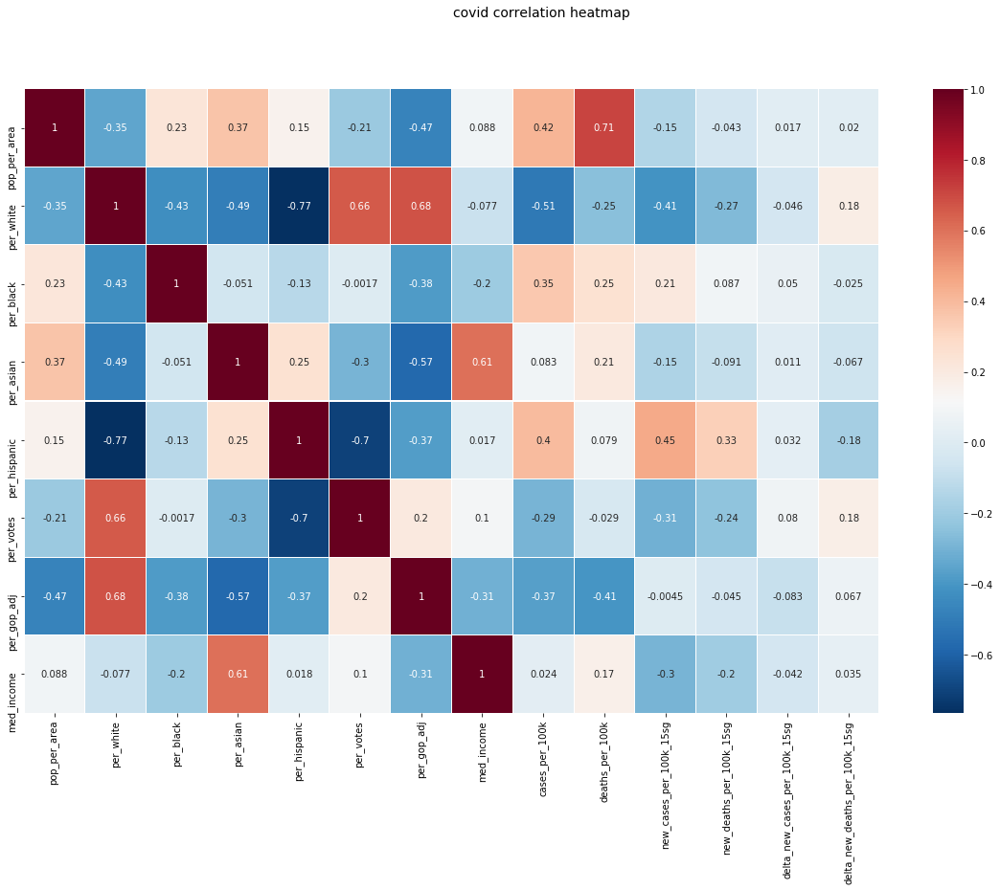

In [37]:
fig, (ax) = plt.subplots(1, 1, figsize=(20,12))

hm = sns.heatmap(np.array(wcm,dtype='float64'), 
                 ax=ax,
                 yticklabels=wcm.index,
                 xticklabels=wcm.columns,
                 cmap="RdBu_r",
                 annot=True, 
#                  fmt='.1f',
                 linewidths=.05)

# fig.subplots_adjust(top=0.93)
fig.suptitle('covid correlation heatmap', 
              fontsize=14)

Single correlations provide the following insights, which may or may not be accurate:

- Cases and deaths per capita -- `cases_per_100k` and `deaths_per_100k` -- are most strongly predicted by population density (`pop_per_area`). This may seem obvious, as we're tracking a disease that is spread through contact with an infected person.
- 

In [76]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

In [78]:
X = df_slice[['med_income', 'pop_per_area', 'per_white', 'per_black', 'per_asian', 'per_votes', 'per_gop_adj']]
Y = df_slice['new_cases_per_100k_15sg']
w = df_slice['tot_pop']

sc = StandardScaler()
S = sc.fit_transform(X)

In [79]:
lr = LinearRegression().fit(X, Y, sample_weight=w)
lr.score(X, Y)

0.10813103226074194

In [82]:
Y = df_slice['cases_per_100k']
X = df_slice[['med_income', 'pop_per_area', 'per_white', 'per_black', 'per_asian', 'per_votes', 'per_gop_adj']]
X = sm.add_constant(X)
wls_model = sm.WLS(Y,X,
#                    weights=df_slice['tot_pop'].values
                  )
results = wls_model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:         cases_per_100k   R-squared:                       0.280
Model:                            WLS   Adj. R-squared:                  0.278
Method:                 Least Squares   F-statistic:                     171.0
Date:                Tue, 21 Jul 2020   Prob (F-statistic):          3.38e-214
Time:                        14:45:53   Log-Likelihood:                -24895.
No. Observations:                3088   AIC:                         4.981e+04
Df Residuals:                    3080   BIC:                         4.985e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         1868.2602    132.123     14.140      0.000    1609.203    2127.318
med_income       0.0045      0.001      3.546      0.000       0.002       0.007
pop_per_area     0.0500      0.017      3.029      0.002       0.018       0.082
per_white    -1365.3108    117.026    -11.667      0.000   -1594.768   -1135.854
per_black     1705.2121    136.164     12.523      0.000    1438.231    1972.193
per_asian    -2105.6926    644.288     -3.268      0.001   -3368.971    -842.414
per_votes    -1314.5074    217.356     -6.048      0.000   -1740.684    -888.331
per_gop_adj    215.4811    123.440      1.746      0.081     -26.551     457.514
==============================================================================
Omnibus:                     3253.226   Durbin-Watson:                   1.897
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           345594.361
Skew:                           5.053   Prob(JB):                         0.00
Kurtosis:                      53.831   Cond. No.                     2.50e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.5e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [85]:
Y = df_slice['cases_per_100k']
X = df_slice[['med_income', 'pop_per_area', 'per_gop_adj']]
X = sm.add_constant(X)
wls_model = sm.WLS(Y,X,
                   weights=df_slice['tot_pop'].values
                  )
results = wls_model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:         cases_per_100k   R-squared:                       0.218
Model:                            WLS   Adj. R-squared:                  0.218
Method:                 Least Squares   F-statistic:                     287.0
Date:                Tue, 21 Jul 2020   Prob (F-statistic):          2.62e-164
Time:                        14:46:23   Log-Likelihood:                -26476.
No. Observations:                3088   AIC:                         5.296e+04
Df Residuals:                    3084   BIC:                         5.298e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         1794.5091     74.059     24.231      0.000    1649.300    1939.718
med_income      -0.0036      0.001     -4.727      0.000      -0.005      -0.002
pop_per_area     0.0516      0.003     16.943      0.000       0.046       0.058
per_gop_adj  -1070.5141     81.537    -13.129      0.000   -1230.386    -910.642
==============================================================================
Omnibus:                     2600.993   Durbin-Watson:                   1.730
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           168043.114
Skew:                           3.594   Prob(JB):                         0.00
Kurtosis:                      38.417   Cond. No.                     5.51e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.51e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [66]:
wls_model.score(results.params)

NotImplementedError: 

In [57]:
predictions = wls_model.predict(results.params, X)
df_slice['predicted_new_cases_per_100k'] = predictions
df_slice.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,date,fips,cases,deaths,cases_per_100k,deaths_per_100k,new_cases,new_deaths,new_cases_per_100k,new_deaths_per_100k,...,per_dem,total_votes,per_votes,per_gop_adj,med_income,days,gop,predicted_cases_per_100k,predicted_new_cases_per_100k,residual_new_cases_per_100k
180,2020-07-19,53061,4849,184,589.843140,22.382168,0.0,0.0,0.000000,0.000000,...,0.542634,309496.0,0.376478,0.409433,82751.0,180,0,686.809521,9.557680,1.621650
358,2020-07-19,17031,98670,4776,1915.835693,92.733665,378.0,2.0,7.339474,0.038833,...,0.743758,2055215.0,0.399053,0.223595,62088.0,180,0,1631.190764,21.549160,-13.676099
535,2020-07-19,06059,29603,494,932.174805,15.555665,592.0,0.0,18.641605,0.000000,...,0.509602,1092116.0,0.343899,0.459253,85398.0,180,0,1080.382881,17.053636,1.831290
711,2020-07-19,04013,95471,1473,2128.476807,32.839779,1601.0,29.0,35.693474,0.646540,...,0.456797,1201934.0,0.267965,0.518177,61606.0,180,1,1203.129493,25.241321,20.574996
887,2020-07-19,06037,155887,4095,1552.797485,40.790482,2846.0,11.0,28.349134,0.109572,...,0.714072,2652072.0,0.264174,0.246727,64251.0,180,0,1377.731803,28.850793,1.378330


In [58]:
df_slice['residual_new_cases_per_100k'] = df_slice['new_cases_per_100k_15sg'] - df_slice['predicted_new_cases_per_100k']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [59]:
chart_title='New Case Density Residuals'
x_col='pop_per_area'
x_scale='sqrt'
x_title='pop per sq mi'
y_col='residual_new_cases_per_100k'
y_scale='sqrt'
y_title='residual new cases per 100k'
s_col='cases_per_100k'
s_title='cases per 100k'
c_col='per_gop'
c_title='percent GOP'
c_scheme='redblue'
c_sort='descending'
w_col='tot_pop'
split=False
line=True

data = df_slice.sort_values(by=c_col).copy()

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
            domain=[np.percentile(data[c_col], 1), np.percentile(data[c_col], 99)],
#             domainMid=params['c_mid'],
        ),
        sort=c_sort,
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.1f',
            title=x_title
        )
    ]
)

chart

alt.Chart(...)

In [22]:
# https://stackoverflow.com/a/34317377
# https://stackoverflow.com/a/47001197
# https://stackoverflow.com/a/31521177

# bins = np.linspace(0, 1, 11)
# wm = lambda x: np.average(x, weights=df_slice.loc[x.index, 'tot_pop'], axis=0)
# m = df_slice.groupby(by=[pd.cut(df_slice['per_gop_adj'], bins)]).apply(wm)
# m

# case density vs. population density

In [185]:
chart_title='Case Density vs. Population Density'
x_col='pop_per_area'
x_scale='sqrt'
x_title='pop per sq mi'
y_col='cases_per_100k'
y_scale='sqrt'
y_title='cases per 100k'
s_col='cases'
s_title='total cases'
c_col='new_cases_per_100k_15sg'
c_title='new cases per 100k (15d window)'
c_scheme='lightmulti'
w_col='tot_pop'
split=False
line=True

data = df_slice.sort_values(by=c_col).copy()

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
            domain=[np.percentile(data[c_col], 1), np.percentile(data[c_col], 99)],
#             domainMid=params['c_mid'],
        ),
        sort='ascending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.1f',
            title=x_title
        )
    ]
)

chart

alt.Chart(...)

# new case density vs. median income

In [191]:
chart_title='Case Density vs. Median Income'
x_col='med_income'
x_scale='linear'
x_title='median income (USD)'
y_col='new_cases_per_100k_15sg'
y_scale='linear'
y_title='new cases per 100k'
s_col='cases'
s_title='total cases'
c_col='per_white'
c_title='percent white'
c_scheme='lightmulti'
w_col='tot_pop'
split=False
line=True

data = df_slice.dropna().sort_values(by='cases').copy()

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
            domain=[np.percentile(data[c_col], 1), np.percentile(data[c_col], 99)],
#             domainMid=params['c_mid'],
        ),
        sort='ascending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.1f',
            title=x_title
        )
    ]
)

pfit = poly.polyfit(data[x_col], data[y_col], 1, 
#                     w=data[w_col]
                   )
fit = poly.polyval(np.unique(data[x_col]), pfit)
line_df = pd.DataFrame({
    'x': np.unique(data[x_col]),
    'y': fit
})
line = alt.Chart(line_df).mark_line(color='black').encode(
    x='x:Q',
    y='y:Q'
)

chart + line

alt.LayerChart(...)

# new case density vs. population density

In [177]:
chart_title='New Case Density vs. Population Density'
x_col='pop_per_area'
x_scale='sqrt'
x_title='pop per sq mi'
y_col='new_cases_per_100k_7sg'
y_scale='sqrt'
y_title='new cases per 100k (7-day sg filter)'
s_col='cases_per_100k'
s_title='cases per 100k'
c_col='med_income'
c_title='median income'
c_scheme='redblue'
w_col='tot_pop'
split=False
line=True

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
#             domain=[1, np.percentile(data[c_col], 99)],
#             domainMid=0.5,
        ),
        sort='descending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.1f',
            title=x_title
        )
    ]
)

chart

alt.Chart(...)

# new case density vs. percent white

In [163]:
data = df_slice.sort_values(by='tot_pop', ascending=False).head(500)
chart_title='New Case Density vs. Percent White'
x_col='per_white'
x_scale='linear'
x_title='percent white'
y_col='new_cases_per_100k_15sg'
y_scale='linear'
y_title='new cases per 100k (15-day sg filter)'
s_col='cases'
s_title='total cases'
c_col='per_gop_adj'
c_title='percent GOP'
c_scheme='redblue'
w_col='tot_pop'
split=False
line=True

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
#             domain=[1, np.percentile(data[c_col], 99)],
            domainMid=0.5,
        ),
        sort='descending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.1f',
            title=x_title
        )
    ]
)

pfit = poly.polyfit(data[x_col], data[y_col], 1, 
#                     w=data[w_col]
                   )
fit = poly.polyval(np.unique(data[x_col]), pfit)
line_df = pd.DataFrame({
    'x': np.unique(data[x_col]),
    'y': fit
})
line = alt.Chart(line_df).mark_line(color='black').encode(
    x='x:Q',
    y='y:Q'
)

chart + line

alt.LayerChart(...)

# vs. percent black

In [162]:
data = df_slice.sort_values(by='tot_pop', ascending=False).head(500)
chart_title='New Case Density vs. Percent Black'
x_col='per_black'
x_scale='linear'
x_title='percent black'
y_col='new_cases_per_100k_15sg'
y_scale='linear'
y_title='new cases per 100k (15-day sg filter)'
s_col='cases'
s_title='total cases'
c_col='per_gop_adj'
c_title='percent GOP'
c_scheme='redblue'
w_col='tot_pop'
split=False
line=True

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
#             domain=[1, np.percentile(data[c_col], 99)],
            domainMid=0.5,
        ),
        sort='descending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.2f',
            title=x_title
        )
    ]
)

pfit = poly.polyfit(data[x_col], data[y_col], 1, 
#                     w=data[w_col]
                   )
fit = poly.polyval(np.unique(data[x_col]), pfit)
line_df = pd.DataFrame({
    'x': np.unique(data[x_col]),
    'y': fit
})
line = alt.Chart(line_df).mark_line(color='black').encode(
    x='x:Q',
    y='y:Q'
)

chart + line

alt.LayerChart(...)

# new case density vs. percent asian

In [161]:
data = df_slice.sort_values(by='tot_pop', ascending=False).head(500)
chart_title='New Case Density vs. Percent Asian'
x_col='per_asian'
x_scale='linear'
x_title='percent asian'
y_col='new_cases_per_100k_15sg'
y_scale='linear'
y_title='new cases per 100k (15-day sg filter)'
s_col='cases'
s_title='total cases'
c_col='per_gop_adj'
c_title='percent GOP'
c_scheme='redblue'
w_col='tot_pop'
split=False
line=True

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
#             domain=[1, np.percentile(data[c_col], 99)],
            domainMid=0.5,
        ),
        sort='descending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.2f',
            title=x_title
        )
    ]
)

pfit = poly.polyfit(data[x_col], data[y_col], 1, 
#                     w=data[w_col]
                   )
fit = poly.polyval(np.unique(data[x_col]), pfit)
line_df = pd.DataFrame({
    'x': np.unique(data[x_col]),
    'y': fit
})
line = alt.Chart(line_df).mark_line(color='black').encode(
    x='x:Q',
    y='y:Q'
)

chart + line

alt.LayerChart(...)

In [160]:
data = df_slice.sort_values(by='tot_pop', ascending=False).head(500)
chart_title='New Case Density vs. Population Density'
x_col='per_hispanic'
x_scale='linear'
x_title='percent hispanic'
y_col='new_cases_per_100k_15sg'
y_scale='linear'
y_title='new cases per 100k (15-day sg filter)'
s_col='cases'
s_title='total cases'
c_col='per_gop_adj'
c_title='percent GOP'
c_scheme='redblue'
w_col='tot_pop'
split=False
line=True

smax = np.max(data[s_col])
smax = smax + (-smax) % 10

chart = alt.Chart(data).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title=chart_title,
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
        scale=alt.Scale(type=x_scale),
        title=x_title
    ),
    y=alt.Y(
        y_col + ':Q',
        scale=alt.Scale(type=y_scale),
        title=y_title
    ),
    size=alt.Size(
        s_col + ':Q',
        scale=alt.Scale(
            domain=[1,smax],
            range=[10,2000]
        ),
        title=s_title
    ),
    color=alt.Color(
        c_col + ':Q',
        scale=alt.Scale(
            scheme=c_scheme,
#             domain=[1, np.percentile(data[c_col], 99)],
            domainMid=0.5,
        ),
        sort='descending',
        title=c_title
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            y_col + ':Q',
            format='.1f',
            title=y_title
        ),
        alt.Tooltip(
            x_col + ':Q',
            format='.2f',
            title=x_title
        )
    ]
)

pfit = poly.polyfit(data[x_col], data[y_col], 1, 
#                     w=data[w_col]
                   )
fit = poly.polyval(np.unique(data[x_col]), pfit)
line_df = pd.DataFrame({
    'x': np.unique(data[x_col]),
    'y': fit
})
line = alt.Chart(line_df).mark_line(color='black').encode(
    x='x:Q',
    y='y:Q'
)

chart + line

alt.LayerChart(...)

In [87]:
def make_bubble_chart(data, params):
    
    smax = np.max(data[params['s_col']])
    smax = smax + (-smax) % 10
    
    chart = alt.Chart(data).mark_circle(
        stroke='black',
        strokeWidth=0.25,
    ).properties(
        title=params['chart_title'],
        width=720,
        height=480
    ).encode(
        x=alt.X(
            params['x_col'] + ':Q',
            scale=alt.Scale(type=params['x_scale']),
            title=params['x_title']
        ),
        y=alt.Y(
            params['y_col'] + ':Q',
            scale=alt.Scale(type=params['y_scale']),
            title=params['y_title']
        ),
        size=alt.Size(
            params['s_col'] + ':Q',
            scale=alt.Scale(
                domain=[1,smax],
                range=[10,2000]
            ),
            title=params['s_title']
        ),
        color=alt.Color(
            params['c_col'] + ':Q',
            scale=alt.Scale(
                scheme=params['c_scheme'],
#                 domainMid=params['c_mid'],
            ),
            sort='ascending',
            title=params['c_title']
        ),
        tooltip=[
            'state:N', 'county:N',
            alt.Tooltip(
                'cases:Q',
                title='total cases',
            ), 
            alt.Tooltip(
                'cases_per_100k:Q',
                format='.1f',
                title='cases per 100k',
            ), 
            alt.Tooltip(
                'pop_per_area:Q',
                format='.1f',
                title='pop per sq mi',
            ), 
            alt.Tooltip(
                params['y_col'] + ':Q',
                format='.1f',
                title=params['y_title']
            ),
            alt.Tooltip(
                params['x_col'] + ':Q',
                format='.1f',
                title=params['x_title']
            )
        ]
    )
    
#     annotation = alt.Chart(line_df).mark_text(
#         align='left',
#         baseline='middle',
#         fontSize=20,
#         dx=7
#     ).encode(
#         x=''
#     )
    
    if params['line']:
        if params['split']:
            if params['w_col']:
                pfit0 = poly.polyfit(data[data['gop']==0][params['x_col']], data[data['gop']==0][params['y_col']], 1, w=data[data['gop']==0][params['w_col']])
                pfit1 = poly.polyfit(data[data['gop']==1][params['x_col']], data[data['gop']==1][params['y_col']], 1, w=data[data['gop']==1][params['w_col']])
            else:
                pfit0 = poly.polyfit(data[data['gop']==0][params['x_col']], data[data['gop']==0][params['y_col']], 1)
                pfit1 = poly.polyfit(data[data['gop']==1][params['x_col']], data[data['gop']==1][params['y_col']], 1)
            fit0 = poly.polyval(np.unique(data[data['gop']==0][params['x_col']]), pfit0)
            fit1 = poly.polyval(np.unique(data[data['gop']==1][params['x_col']]), pfit1)
            print(pfit0)
            print(pfit1)
            line_df0 = pd.DataFrame({
              'x': np.unique(data[data['gop']==0][params['x_col']]),
              'y': fit0
            })
            line_df1 = pd.DataFrame({
              'x': np.unique(data[data['gop']==1][params['x_col']]),
              'y': fit1
            })
            line0 = alt.Chart(line_df0).mark_line(color='darkblue').encode(
                x='x:Q',
                y='y:Q'
            ).transform_calculate(label='datum.y + "inches"')
            line1 = alt.Chart(line_df1).mark_line(color='firebrick').encode(
                x='x:Q',
                y='y:Q'
            )
            return chart + line0 + line1
        else:
            if params['w_col']:
                pfit = poly.polyfit(data[params['x_col']], data[params['y_col']], 1, w=data[params['w_col']])
            else:
                pfit = poly.polyfit(data[params['x_col']], data[params['y_col']], 1)
            print(pfit)
            fit = poly.polyval(np.unique(data[params['x_col']]), pfit)
            line_df = pd.DataFrame({
              'x': np.unique(data[params['x_col']]),
              'y': fit
            })
            line = alt.Chart(line_df).mark_line(color='black').encode(
                x='x:Q',
                y='y:Q'
            )
            return chart + line
    else:
        return chart

In [88]:
params = dict(
    chart_title='Case Density vs. Population Density',
    x_col='pop_per_area',
    x_scale='log',
    x_title='pop per sq mi',
    y_col='cases_per_100k',
    y_scale='sqrt',
    y_title='cases per 100k',
    s_col='cases',
    s_title='total cases',
    c_col='new_cases_per_100k_7sg',
    c_title='new cases per 100k',
    c_scheme='blues',
    c_mid=None,
    w_col='tot_pop',
    split=False,
    line=True
)

make_bubble_chart(df_slice, params)

[1.28265800e+03 5.23151012e-02]


alt.LayerChart(...)

In [76]:
params = dict(
    chart_title='Case Density vs. Population Density',
    x_col='pop_per_area',
    x_scale='log',
    x_title='pop per sq mi',
    y_col='cases_per_100k',
    y_scale='sqrt',
    y_title='cases per 100k',
    s_col='cases',
    s_title='cases',
    c_col='per_gop',
    c_title='percent GOP',
    w_col='tot_pop',
    split=False,
    line=True
)

make_bubble_chart(df_slice[df_slice['state'] == 'California'], params)

[1.21528987e+03 3.30001801e-02]


alt.LayerChart(...)

In [73]:
df_slice['tot_pop'].min()

404

In [95]:
df_slice.groupby(by='gop')['cases'].count()

gop
0     493
1    2591
Name: cases, dtype: int64

In [97]:
df_slice.groupby(by='gop')['tot_pop'].sum()

gop
0    178756543
1    149341654
Name: tot_pop, dtype: int32

In [100]:
df_slice.groupby(by='gop')['pop_per_area'].describe()

,count,mean,std,min,25%,50%,75%,max
gop,,,,,,,,
0,493.0,919.819031,2223.597900,0.035944,33.087040,167.690918,936.657776,27546.974609
1,2591.0,100.155556,199.968323,0.164452,16.301805,40.978436,94.651871,3560.991699


In [115]:
df_slice.groupby(by='gop')['cases'].sum() / df_slice.groupby(by='gop')['tot_pop'].sum() * 100000

gop
0    1279.081012
1     854.711975
dtype: float64

In [61]:
params = dict(
    chart_title='New Cases per 100k vs. Percent GOP Votes in 2016 GE',
    x_col='per_gop',
    x_scale='linear',
    x_title='percent GOP',
    y_col='new_cases_per_100k_7sg',
    y_scale='sqrt',
    y_title='new cases per 100k (7-day sg filter)',
    s_col='cases',
    s_title='total cases',
    c_col='per_gop',
    c_title='percent GOP',
    w_col='tot_pop',
    split=False,
    line=True
)

make_bubble_chart(df_slice, params)

[ 8.54679412 51.14796926]


alt.LayerChart(...)

In [184]:
df_temp = df_slice.groupby(by='state').sum()
df_temp['cases_per_100k'] = df_temp['cases'] / df_temp['tot_pop'] * 100_000
df_temp['new_cases_per_100k_7sg'] = df_temp['new_cases_7sg'] / df_temp['tot_pop'] * 100_000
df_temp.sort_values(by='new_cases_per_100k_7sg', ascending=False)['new_cases_per_100k_7sg']

state
Florida                 55.705689
Texas                   45.138826
Louisiana               43.568134
Arizona                 42.585996
Alabama                 41.002503
Nevada                  38.476023
South Carolina          36.667964
Idaho                   34.600888
Mississippi             33.588469
Tennessee               33.431674
Georgia                 26.492505
California              24.134462
Rhode Island            23.565420
Arkansas                23.363724
Oklahoma                21.744459
North Carolina          18.382086
Iowa                    17.725439
Utah                    16.632034
Wisconsin               14.975941
Washington              14.604183
New Mexico              13.795920
Missouri                13.777874
Nebraska                13.257356
Kansas                  12.557230
Maryland                11.728563
Montana                 11.538424
Virginia                11.115347
North Dakota            10.942067
Ohio                    10.402548
Kentucky

In [ ]:
alt.chart(df_slice, height=20).transform_joinaggregate(
    mean_cases='mean(cases)', groupby=['state']
).transform_bin(
    ['bin_max', 'bin_min'], 'cases'
).transform_aggregate(
    value='count()', groupby=['state', 'mean_cases', 'bin_min', 'bin_max']
).mark_area(
    interpolate='monotone',
    fillOpacity=0.8,
    stroke='black',
    strokeWidth=0.25
).encode(
    alt.X()
)

In [64]:
x_col = 'per_gop'
y_col = 'new_cases_per_100k_7sg'
z_col = 'cases'
c_col = 'per_gop'
w_col = 'pop_per_area'

size_col = 'cases'
zmax = np.max(df_slice[size_col])
zmax = zmax + (-zmax) % 10

color_col = 'per_gop'
# cmax = np.percentile(df[color_col], 99.9)
# cmax = cmax + (-cmax) % 10
# cmin = np.percentile(df[color_col], 0.1)
# cmin = cmin + (-cmin) % 10

# brush = alt.selection(type='interval')

chart = alt.Chart(df_slice).mark_circle(
    stroke='black',
    strokeWidth=0.25,
).properties(
    title='New Cases per County (7d linear SG) vs. Percent GOP votes in 2016 General Election',
    width=720,
    height=480
).encode(
    x=alt.X(
        x_col + ':Q',
#         scale=alt.Scale(type='log')
    ),
    y=alt.Y(
        y_col + ':Q',
#         scale=alt.Scale(type='log')
    ),
    size=alt.Size(
        size_col + ':Q',
        scale=alt.Scale(
            domain=[0,zmax],
            range=[10,2000]
        ),
        title='total cases'
    ),
    color=alt.Color(
        color_col + ':Q',
        scale=alt.Scale(
            scheme='redblue',
            domainMid=0.5,
        ),
        sort='descending',
        title='percent GOP'
    ),
    tooltip=[
        'state:N', 'county:N',
        alt.Tooltip(
            'cases:Q',
            title='total cases',
        ), 
        alt.Tooltip(
            'cases_per_100k:Q',
            format='.1f',
            title='cases per 100k',
        ), 
        alt.Tooltip(
            'pop_per_area:Q',
            format='.1f',
            title='pop per sq mi',
        ), 
        alt.Tooltip(
            'new_cases_per_100k_7sg:Q',
            format='.1f',
            title='new cases per 100k'
        )]
)

# fit = [
#     chart.transform_regression(
#         x_col, y_col, method='poly', order=1, as_=['degree', y_col]
#     ).mark_line(size=4)
# ]

# alt.layer(chart, *fit)

fit = poly.polyval(np.unique(df_slice[x_col]), poly.polyfit(df_slice[x_col], df_slice[y_col], 1, w=df_slice[w_col]))

line_df = pd.DataFrame({
  'x': np.unique(df_slice[x_col]),
  'y': fit
})

line = alt.Chart(line_df).mark_line(color='black').encode(
    x='x:Q',
    y='y:Q'
)

chart + line

alt.LayerChart(...)

In [16]:
df_slice = df_slice.dropna()

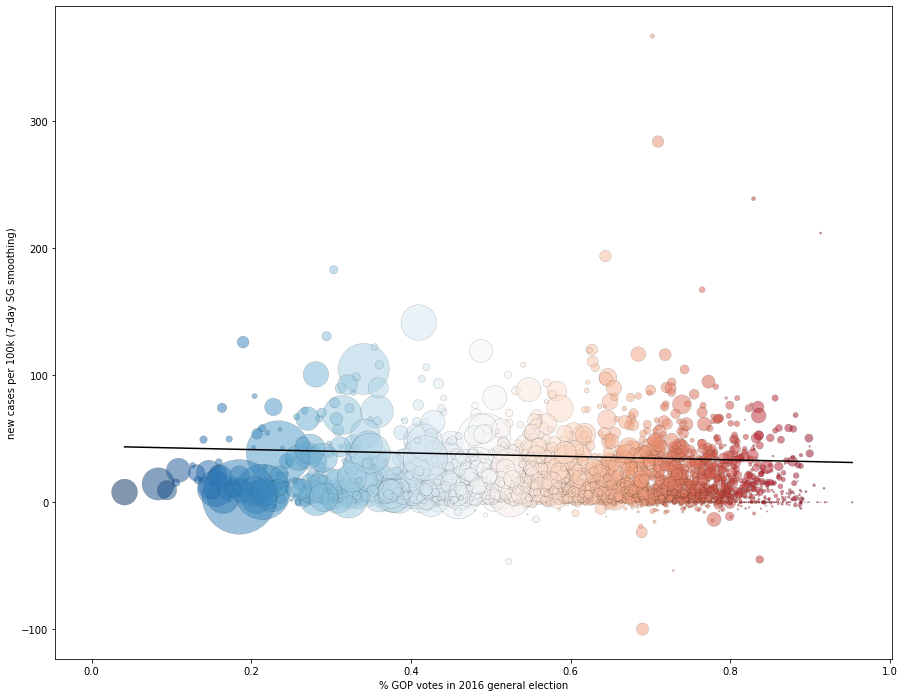

In [32]:
x_col = 'per_gop'
y_col = 'new_cases_per_100k_7sg'
z_col = 'cases'
c_col = 'per_gop'
w_col = 'cases_per_100k'

x = df_slice[x_col]
y = df_slice[y_col]
z = df_slice[z_col]
c = df_slice[c_col]
w = df_slice[w_col]

x0 = df_slice[df_slice['gop'] == 0][x_col]
x1 = df_slice[df_slice['gop'] == 1][x_col]
y0 = df_slice[df_slice['gop'] == 0][y_col]
y1 = df_slice[df_slice['gop'] == 1][y_col]
z0 = df_slice[df_slice['gop'] == 0][z_col]
z1 = df_slice[df_slice['gop'] == 1][z_col]
w0 = df_slice[df_slice['gop'] == 0][w_col]
w1 = df_slice[df_slice['gop'] == 1][w_col]


plt.scatter(x, y, s=z ** 0.7, c=c, cmap='RdBu_r', edgecolors='black', linewidth=0.2, alpha=0.5)
# plt.xscale('log')
# plt.yscale('log')
# plt.xlim(0.01)
plt.xlabel('% GOP votes in 2016 general election')
plt.ylabel('new cases per 100k (7-day SG smoothing)')
plt.gcf().set_size_inches((15,12))
plt.plot(np.unique(x), poly.polyval(np.unique(x), poly.polyfit(x, y, 1, w=w)), c='black')
# plt.plot(np.unique(x0), poly.polyval(np.unique(x0), poly.polyfit(x0, y0, 1, w=w0)), c='blue')
# plt.plot(np.unique(x1), poly.polyval(np.unique(x1), poly.polyfit(x1, y1, 1, w=w1)), c='red')
plt.show()